# Project 1: Gradient-based Algorithms and Differentiable Programming

## 1. Problem Formulation
For a 2D case of rocket landing problem, we have the following states: <br />
$
\begin{aligned}
x(t) = \begin{bmatrix} x_h(t) & x_v(t) & \dot{x}_h(t) & \dot{x}_v(t) \end{bmatrix}
\end{aligned}
$ <br />
where $x_h$ and $x_v$ indicates the horizontal and vertical coordinates while $\dot{x}_1$ and $\dot{x}_2$ are the corresponding horizontal and vertical velocity.<br />
With input of $a(t) = \begin{bmatrix} a_h(t) & a_v(t) \end{bmatrix}$, we can formulate the following dynamic systems:<br />
$x_h(t+1) = x_h(t) + \dot{x}_h\Delta t$<br />
$x_v(t+1) = x_v(t) + \dot{x}_v\Delta t$<br />
$\dot{x}_h(t+1) = \dot{x}_h(t) + a_h(t)\Delta t$<br />
$\dot{x}_v(t+1) = \dot{x}_v(t) + a_v(t)\Delta t$<br />
where $\Delta t$ is a time interval. For a closed-loop controller be:<br />
$a(t)=f_{\theta}(x(t))+D(t)+G$

where $f_{\theta}(\cdot)$ is a neural network with parameters $\theta$, $D$ is the drag force ratio which is defined by
$D(t)=\begin{bmatrix} -c_d(x_h(t))^2 & -c_d(x_v(t))^2\end{bmatrix}$ with a constant drag coefficient $c_d$ and
$G$ is the gravitational force ratio defined as $G = \begin{bmatrix}0 & -g \end{bmatrix}$.<br />
For each time step, we assign a loss as a function of the control input and the state: $l(x(t),a(t))$. <br />
In this example, we will simply set $l(x(t),a(t))=0$ for all
$t=1,...,T-1$, where $T$ is the final time step, and $l(x(T), a(T))=||x(T)||^2$. <br />
With adding randomness on the initial conditions of the position, such as:
$ X_0 = \begin{bmatrix}X_h(T_0) + Z_h & X_v(T_0) + Z_v \end{bmatrix} $ <br />
where $\begin{bmatrix}X_h(T_0) & X_v(T_0) \end{bmatrix} = \begin{bmatrix} 0 & 1 \end{bmatrix}$,
$Z_h \sim N(0,\sigma)$ and $Z_v \sim N(0, \sigma)$ <br />

Hence, we have the following optimization problem: <br />
$min_{\theta} \Sigma_{i=1}^{N}||x^{(i)}(T)||^2$ <br />
$x_h(t+1) = x_h(t) + \dot{x}_h\Delta t$<br />
$x_v(t+1) = x_v(t) + \dot{x}_v\Delta t$<br />
$\dot{x}_h(t+1) = \dot{x}_h(t) + a_h(t)\Delta t $<br />
$\dot{x}_v(t+1) = \dot{x}_v(t) + a_v(t)\Delta t $<br />
$a(t)=f(x^{(i)}(t))+D^{(i)}(t)+g$ <br />
$D(t)=\begin{bmatrix} -c_d(x_h(t))^2 & -c_d(x_v(t))^2\end{bmatrix}$ <br />
$G = \begin{bmatrix} 0 & -g \end{bmatrix}$<br />
$x_h^{0}=x_h(1)+Z_h$<br />
$x_v^{0}=x_v(1)+Z_v$<br />
where $\begin{bmatrix} x_h(1) & x_v(1) \end{bmatrix} = \begin{bmatrix}0 & 1 \end{bmatrix}$, $Z_h \sim N(0,\sigma)$ and $Z_v \sim N(0, \sigma)$. <br />

## 2. Programming Part

In [321]:
import logging
import numpy as np
import torch as t
import torch.nn as nn
from torch import optim
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)
FRAME_TIME = 0.1
GRAVITY_ACCEL = 0.12
BOOST_ACCEL = 0.18
DRAG_ACCEL = 0.002

In [322]:
class Dynamics(nn.Module):

    def __init__(self):
        super(Dynamics, self).__init__()
    @staticmethod
    def forward(state, action):

        delta_state_ = []
        for i in range(len(state)):

            delta_state_gravity = t.tensor([0., 0., 0., -GRAVITY_ACCEL * FRAME_TIME])
            delta_state_drag = t.tensor([0., 0., -DRAG_ACCEL * state[i, 2]**2 * FRAME_TIME,  -DRAG_ACCEL * state[i, 3]**2 * FRAME_TIME])
            delta_state_thrust = BOOST_ACCEL * FRAME_TIME * t.tensor([0.,0., 1, 1.]) * t.cat((t.zeros(2), action[i]))
            delta_state = delta_state_thrust + delta_state_gravity + delta_state_drag
            delta_state_.append(delta_state)

        delta_state_mat = t.stack(delta_state_)
        state = state + delta_state_mat

        step_mat = t.tensor([[1., 0., 0., 0.],
                            [0., 1., 0., 0.],
                            [FRAME_TIME, 0., 1., 0.],
                            [0., FRAME_TIME, 0., 1]])
        state = t.matmul(state, step_mat)

        return state

In [323]:
class Controller(nn.Module):

    def __init__(self, dim_input, dim_hidden, dim_output):
        """
        dim_input: # of system states
        dim_output: # of actions
        dim_hidden: up to you
        """
        super(Controller, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(dim_input, dim_hidden),
            nn.Tanh(),
            nn.Linear(dim_hidden, dim_output),
            nn.Tanh()
        )

    def forward(self, state):
        action = self.network(state)
        #print(action)
        return action

class Simulation(nn.Module):

    def __init__(self, controller, dynamics, T):
        super(Simulation, self).__init__()
        self.state = self.initialize_state()
        self.controller = controller
        self.dynamics = dynamics
        self.T = T
        self.action_trajectory = []
        self.state_trajectory = []

    def forward(self, state):
        self.action_trajectory = []
        self.state_trajectory = []
        for _ in range(T):
            action = self.controller.forward(state)
            state = self.dynamics.forward(state, action)
            self.action_trajectory.append(action)
            self.state_trajectory.append(state)
        return self.error(state)

    @staticmethod
    def initialize_state():

        N = 20
        sigma = 0.1
        state = [[np.random.normal(0, sigma), 1 + np.random.normal(0, sigma), 0., 0.]]

        for i in range(N-1):
            state.append([np.random.normal(0, sigma), 1 + np.random.normal(0, sigma), 0., 0.])

        return t.tensor(state, requires_grad=False).float()

    def error(self, state):

        err = 0
        for i in range (len(state)):
            err += state[i,0]**2 + state[i,1]**2 + state[i,2]**2 + state[i,3]**2

        return err/len(state)

class Optimize:
    def __init__(self, simulation):
        self.simulation = simulation
        self.parameters = simulation.controller.parameters()
        self.optimizer = optim.LBFGS(self.parameters, lr = 0.1)

    def step(self):
        def closure():
            loss = self.simulation(self.simulation.state)
            self.optimizer.zero_grad()
            loss.backward()
            return loss
        self.optimizer.step(closure)
        return closure()

    def train(self, epochs):
        for epoch in range(epochs):
            loss = self.step()
            self.loss = loss
            loss_.append(loss.detach().numpy())
            print('[%d] loss: %.3f' % (epoch + 1, loss))
            self.visualize()

    def visualize(self):

        results = np.array([self.simulation.state_trajectory[i].detach().numpy() for i in range(self.simulation.T)])
        t = np.arange(0, T * FRAME_TIME, FRAME_TIME)
        fig, (ax1,ax2,ax3) = plt.subplots(1, 3,figsize=(20,5))

        for i in range(len(results[0,:,1])):

            x = results[:,i,:][:,0]
            y = results[:,i,:][:,1]
            xdot = results[:,i,:][:,2]
            ydot = results[:,i,:][:,3]
            ax1.plot(x, y)
            ax2.plot(t, xdot)
            ax3.plot(t, ydot)
            ax1.set_title('Trajectory')
            ax1.set_xlim([-1, 1])
            ax2.set_title('X-Velocity')
            ax3.set_title('Y-Velocity')

        plt.show()

[1] loss: 0.289


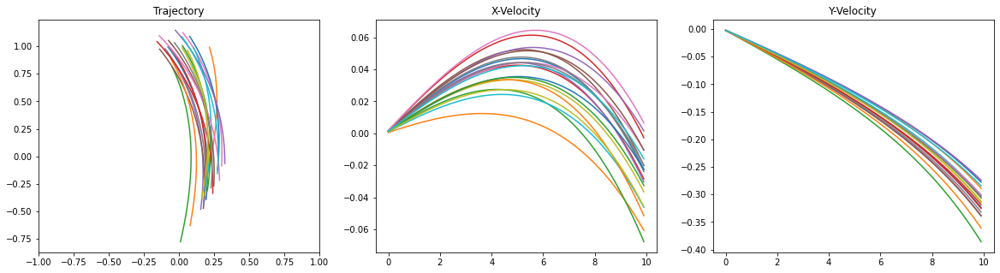

[2] loss: 0.087


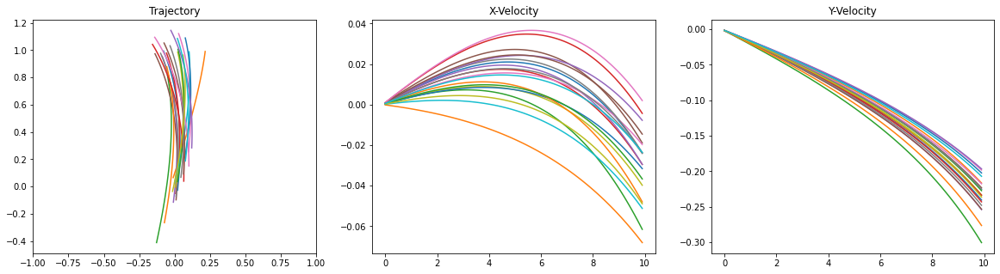

[3] loss: 0.078


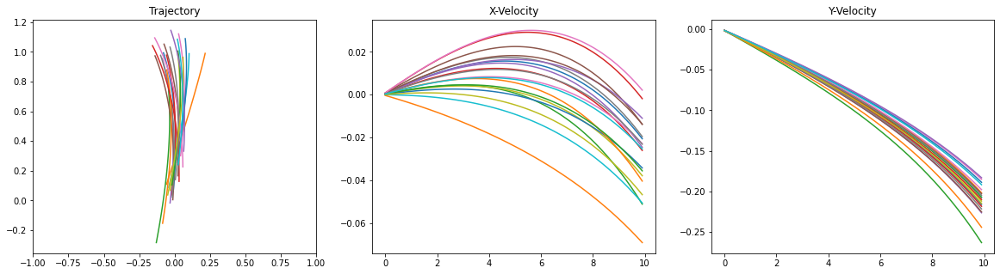

[4] loss: 0.036


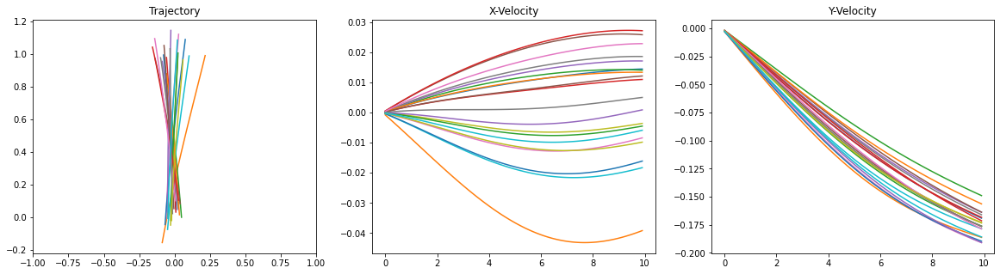

[5] loss: 0.024


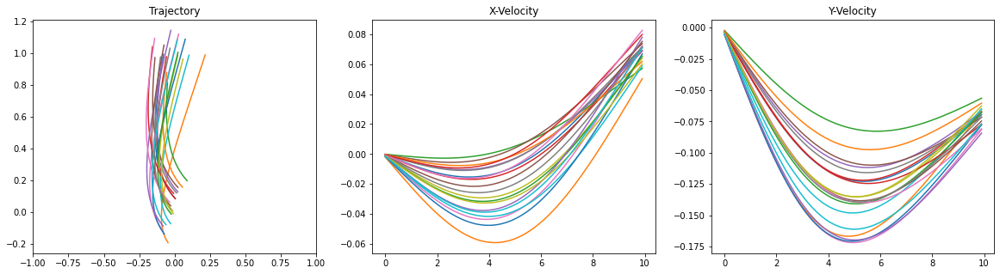

[6] loss: 0.015


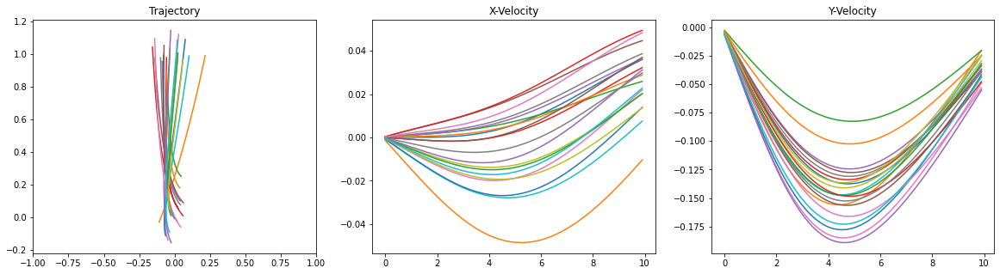

[7] loss: 0.008


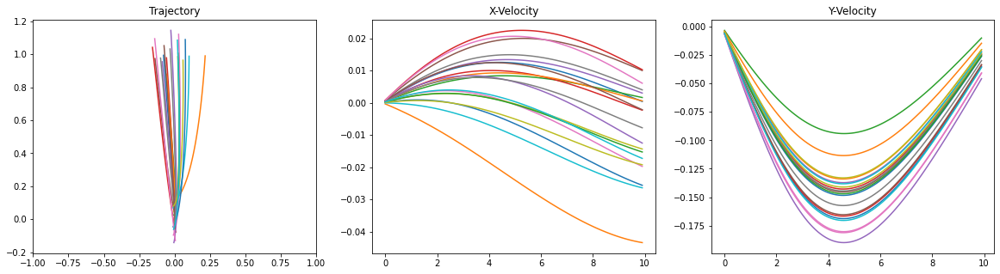

[8] loss: 0.003


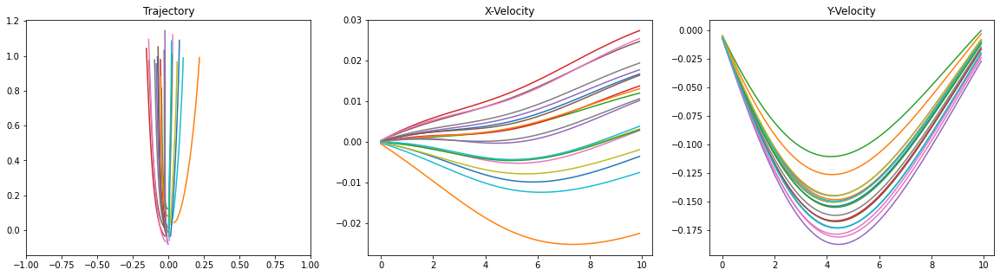

[9] loss: 0.001


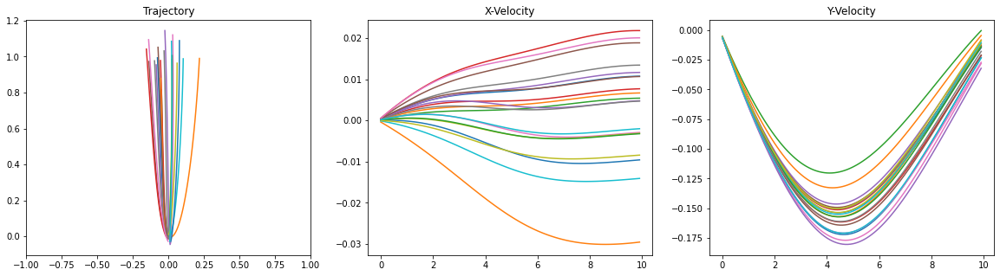

[10] loss: 0.001


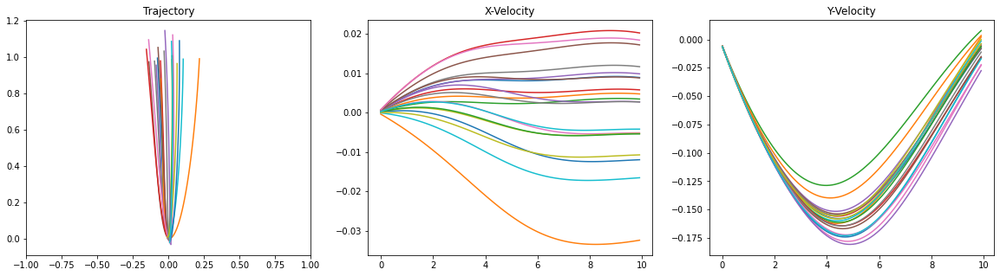

[11] loss: 0.000


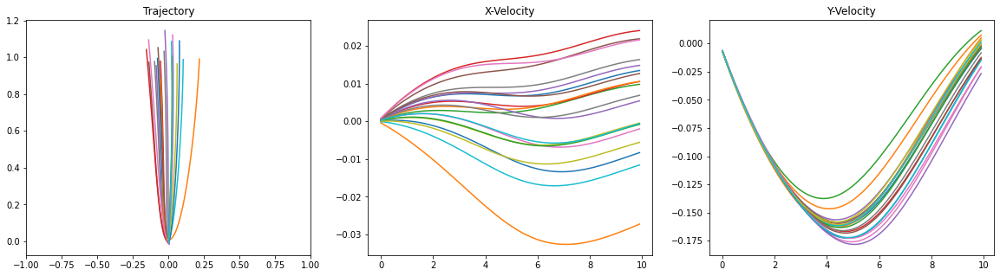

[12] loss: 0.000


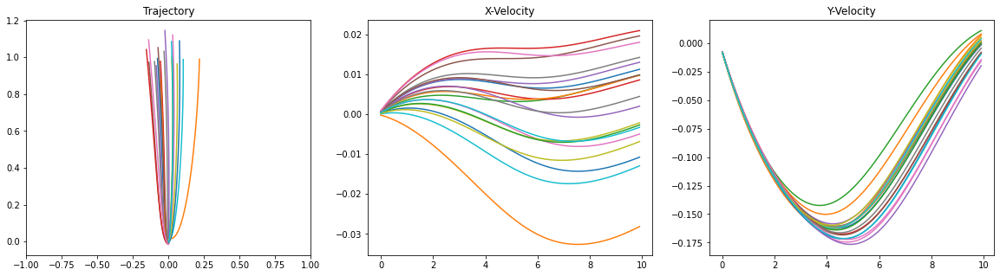

[13] loss: 0.000


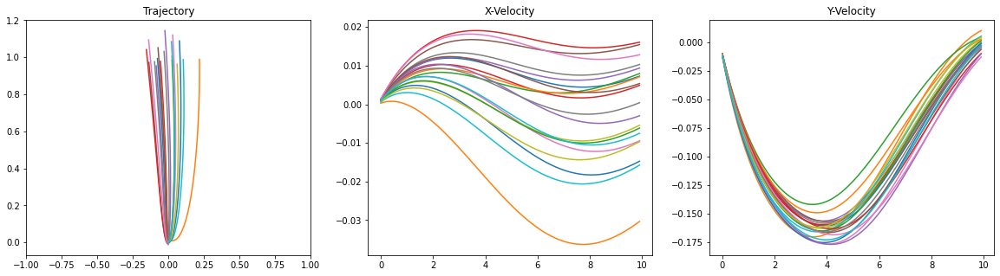

[14] loss: 0.000


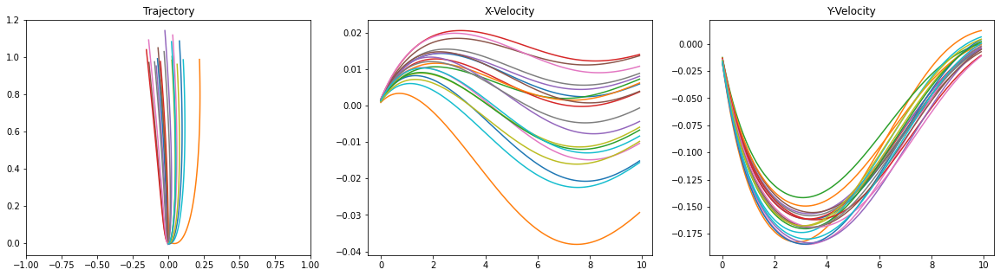

[15] loss: 0.000


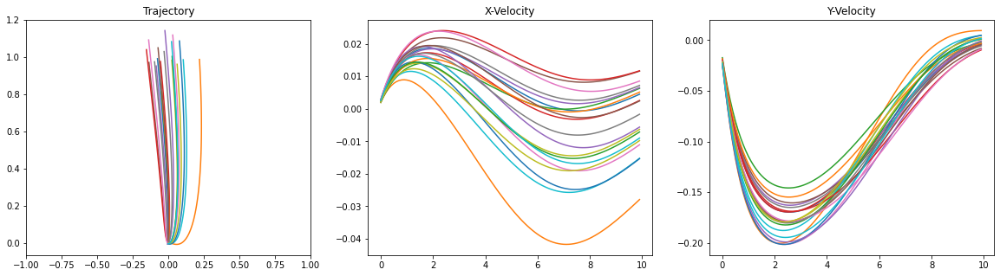

[16] loss: 0.000


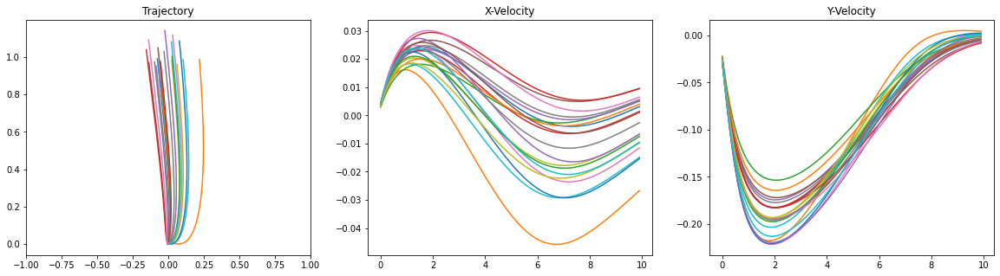

[17] loss: 0.000


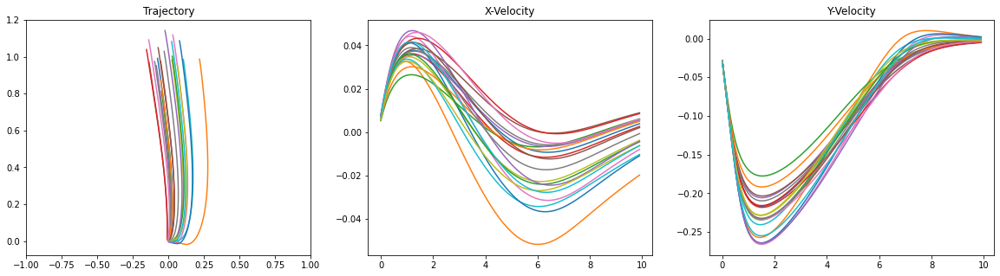

[18] loss: 0.000


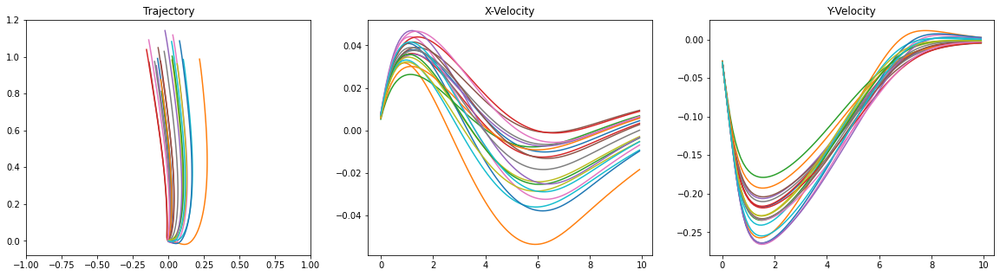

[19] loss: 0.000


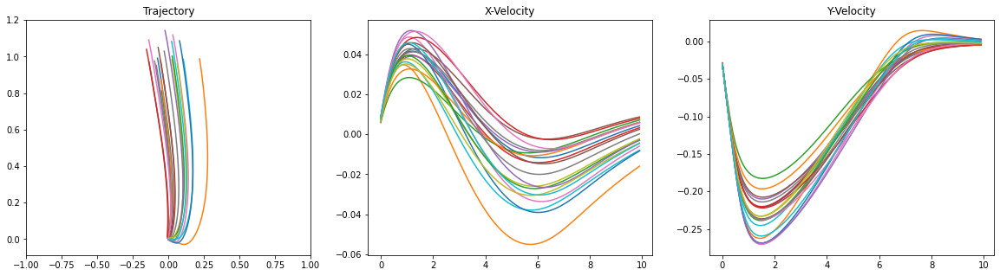

[20] loss: 0.000


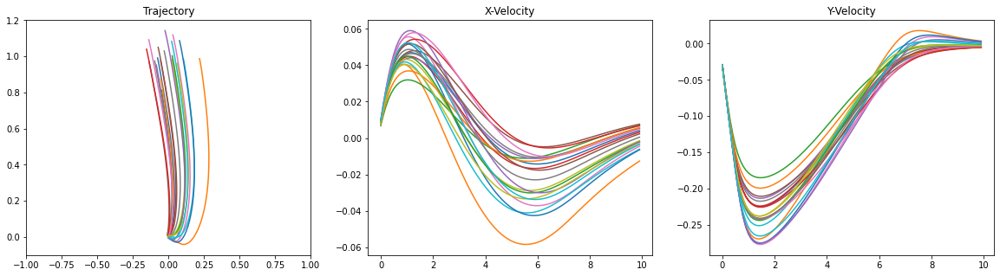

[21] loss: 0.000


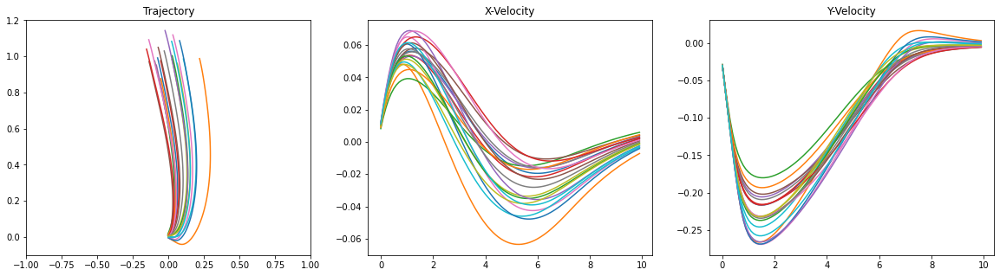

[22] loss: 0.000


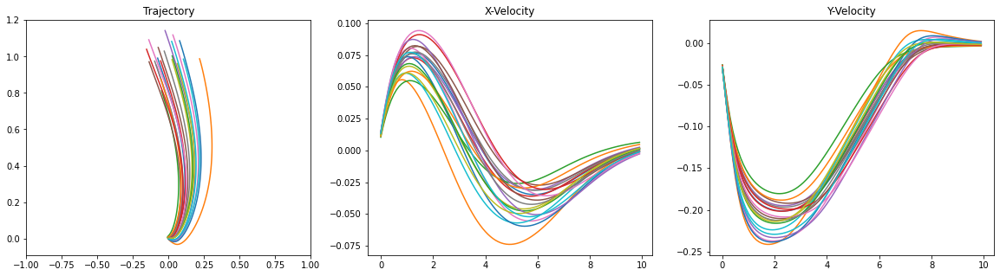

[23] loss: 0.000


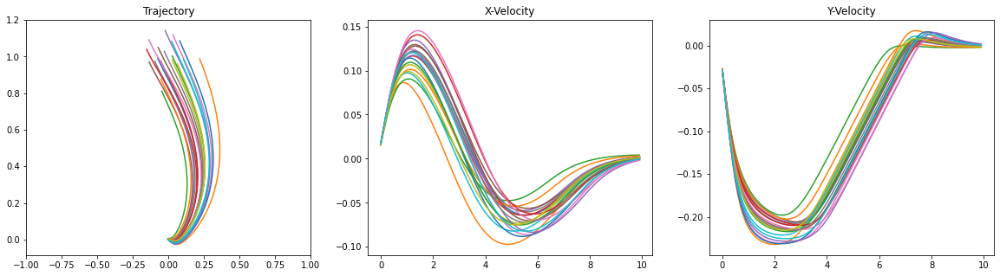

[24] loss: 0.000


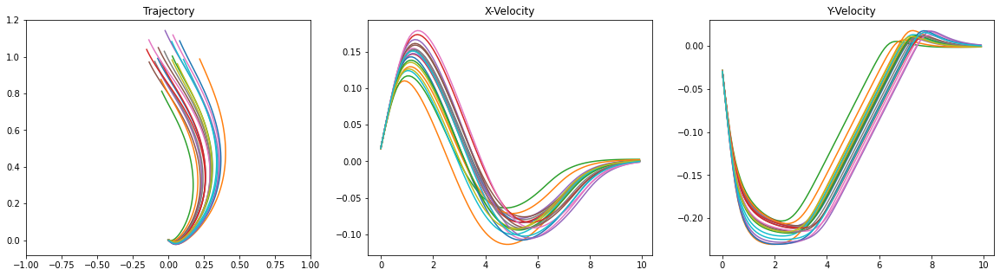

[25] loss: 0.000


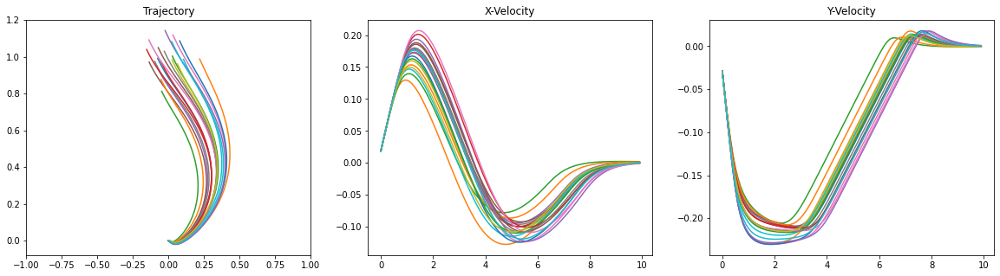

[26] loss: 0.000


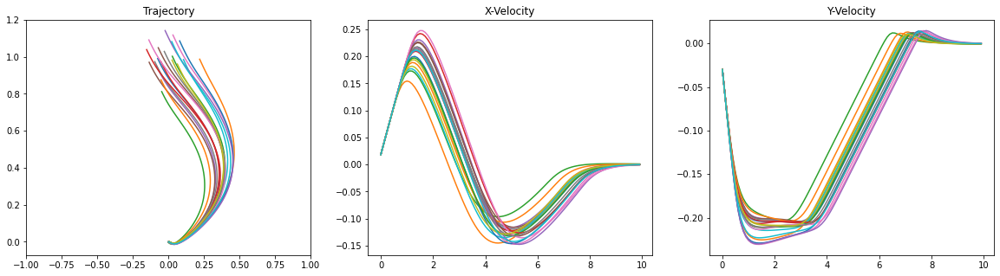

[27] loss: 0.000


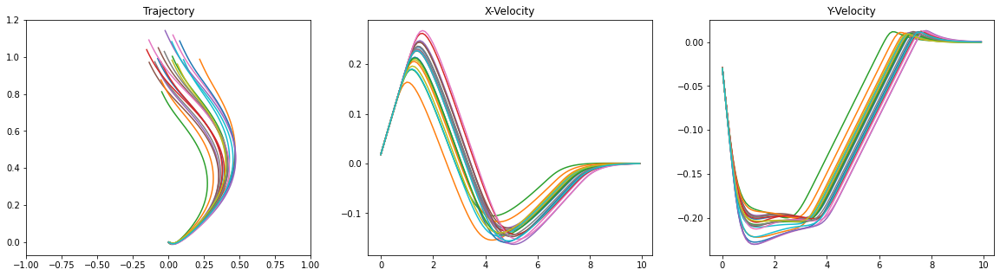

[28] loss: 0.000


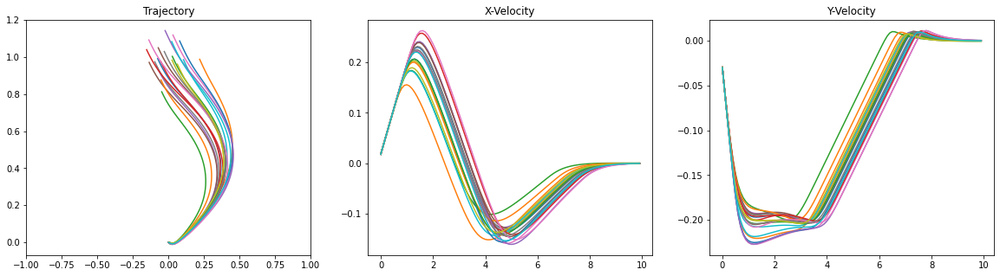

[29] loss: 0.000


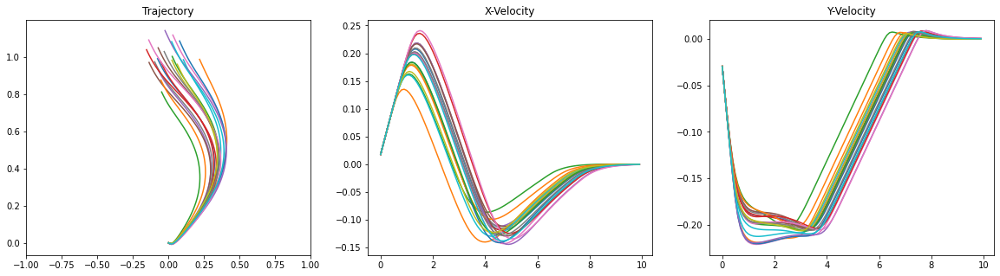

[30] loss: 0.000


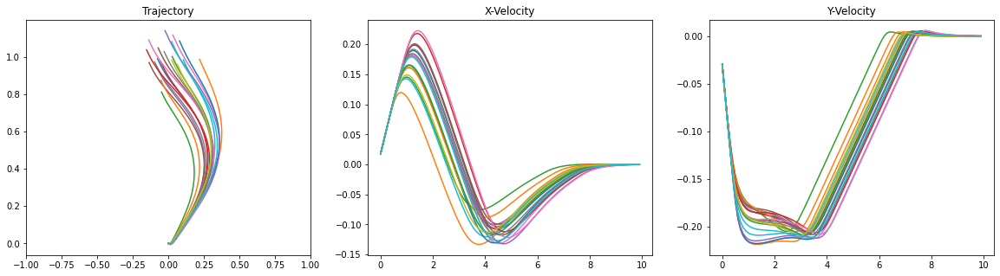

[31] loss: 0.000


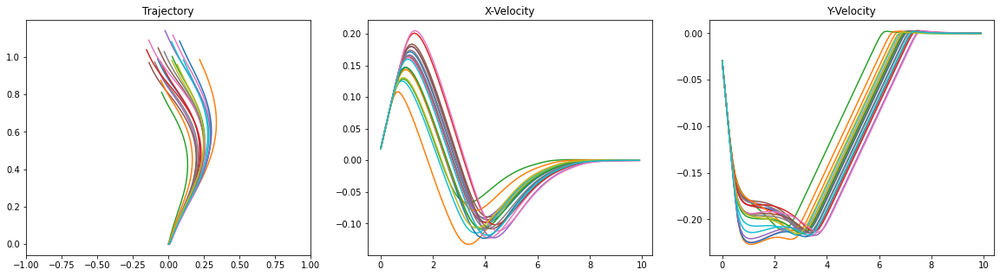

[32] loss: 0.000


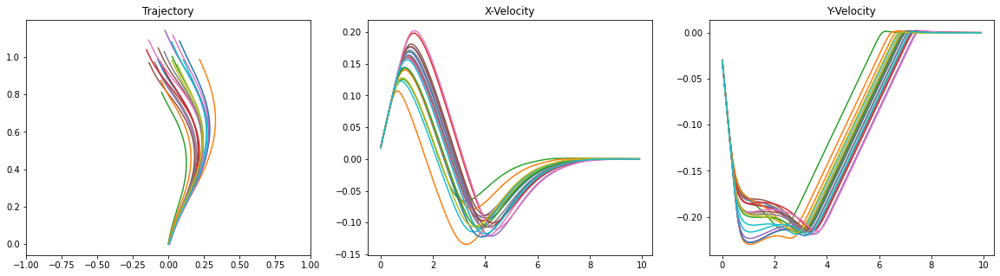

[33] loss: 0.000


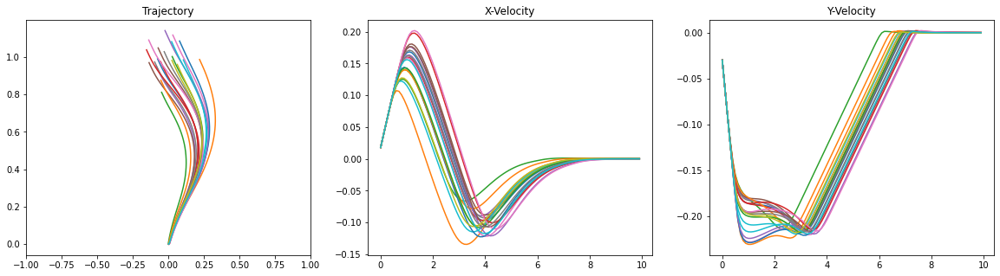

[34] loss: 0.000


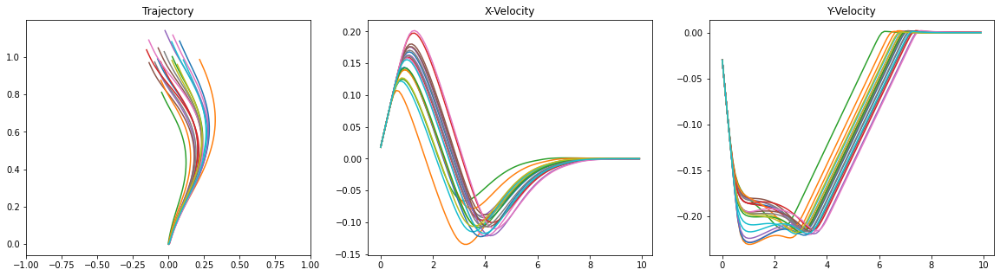

[35] loss: 0.000


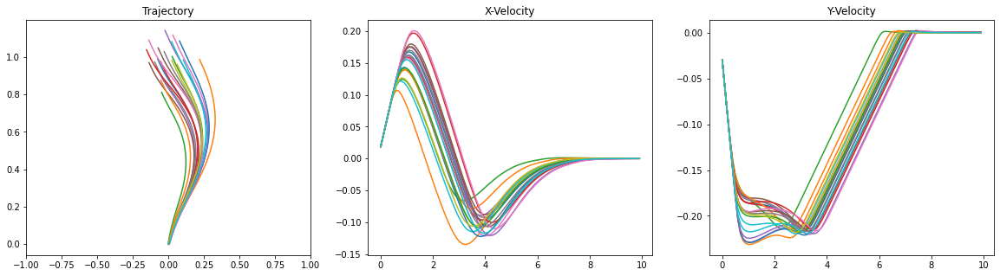

[36] loss: 0.000


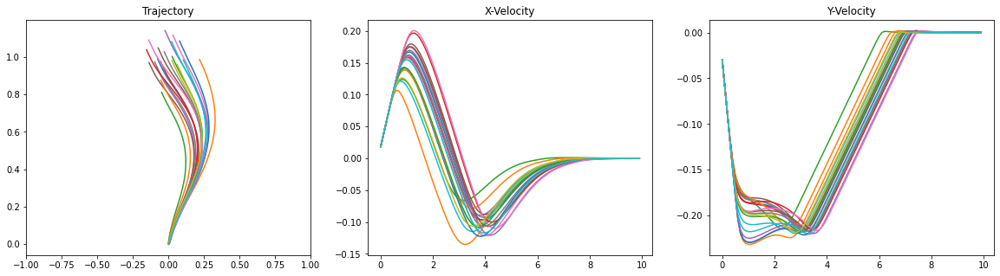

[37] loss: 0.000


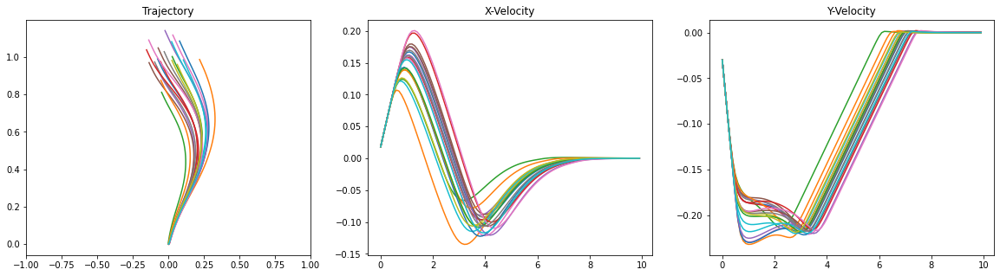

[38] loss: 0.000


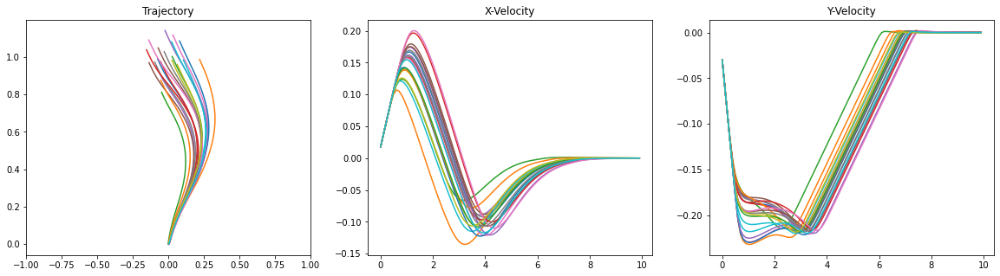

[39] loss: 0.000


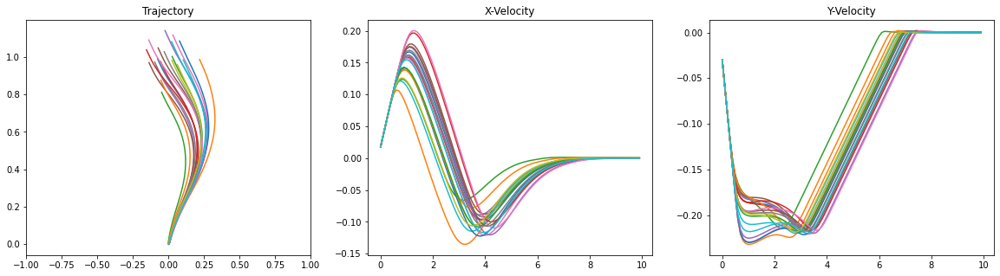

[40] loss: 0.000


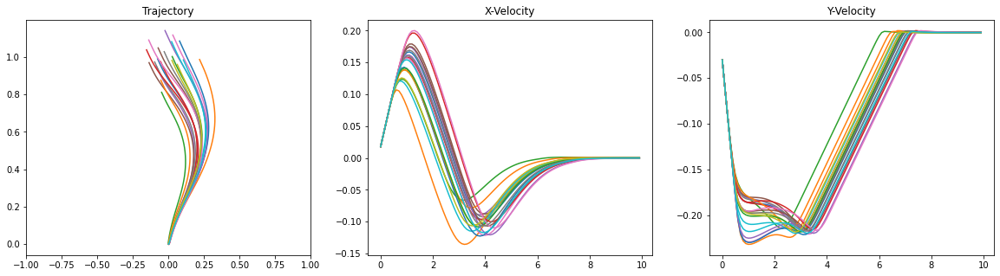

[41] loss: 0.000


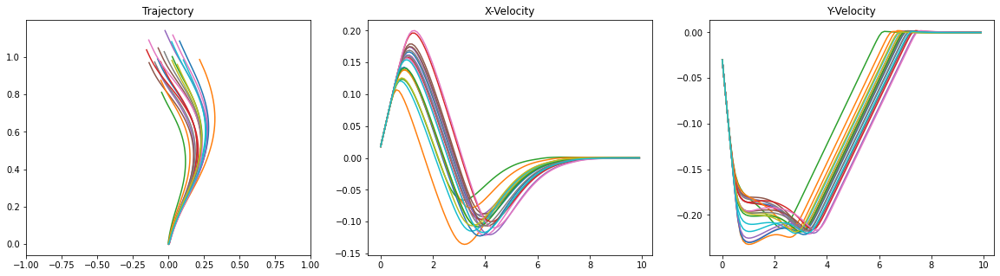

[42] loss: 0.000


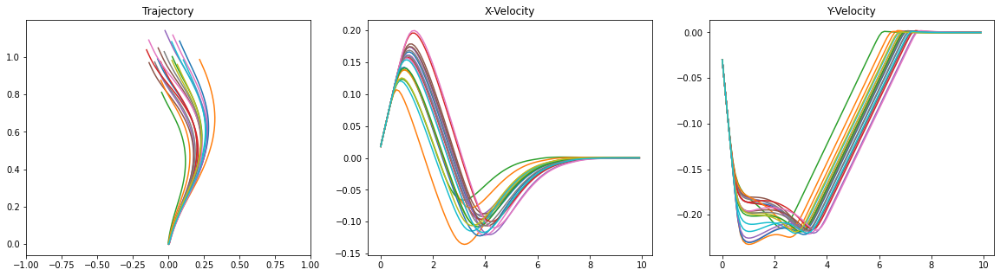

[43] loss: 0.000


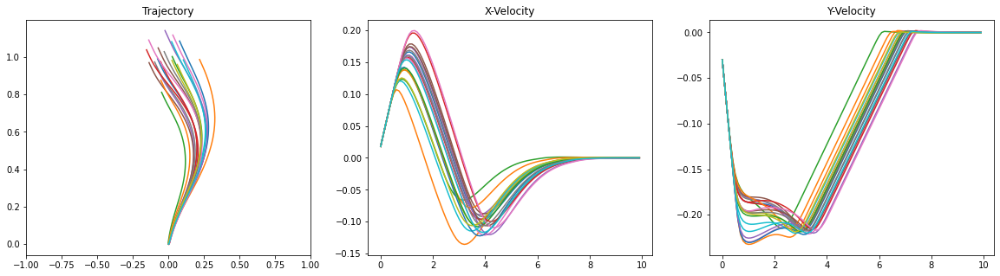

[44] loss: 0.000


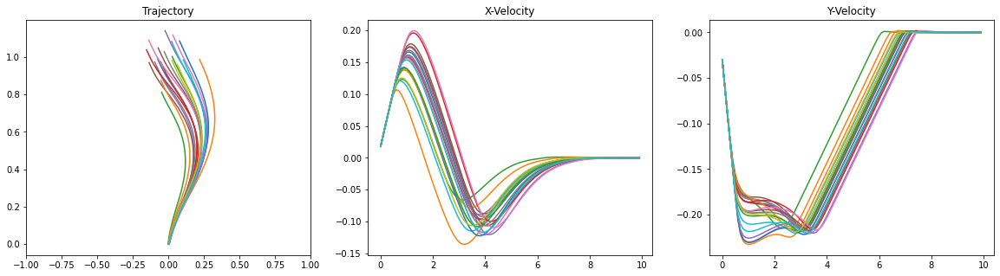

[45] loss: 0.000


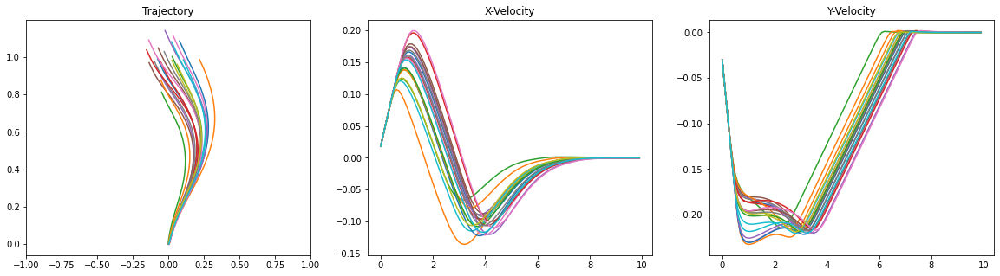

[46] loss: 0.000


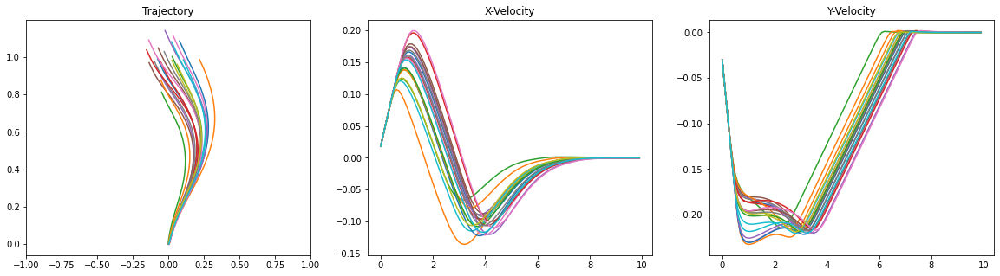

[47] loss: 0.000


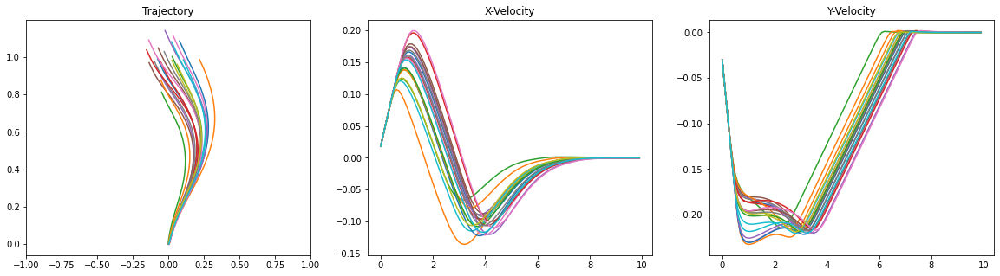

[48] loss: 0.000


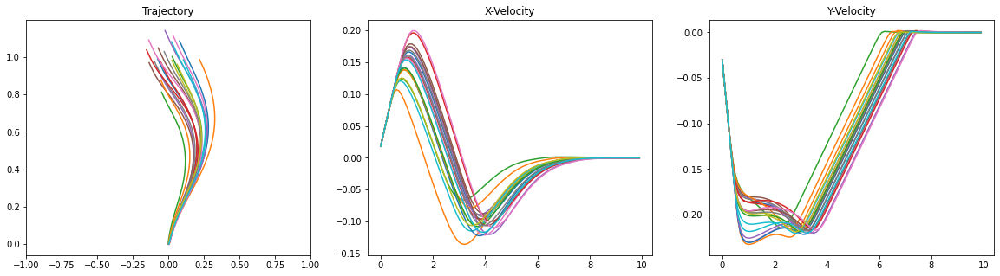

[49] loss: 0.000


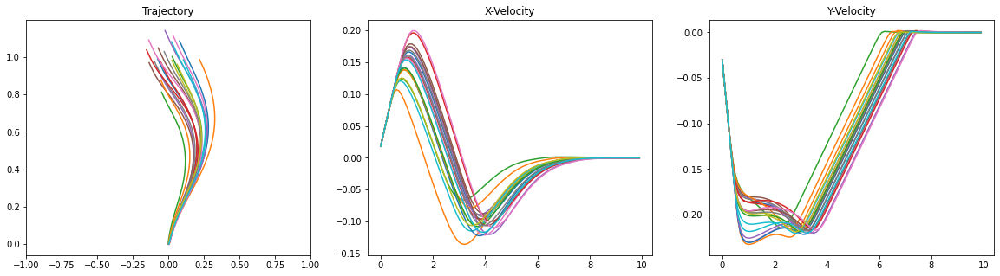

[50] loss: 0.000


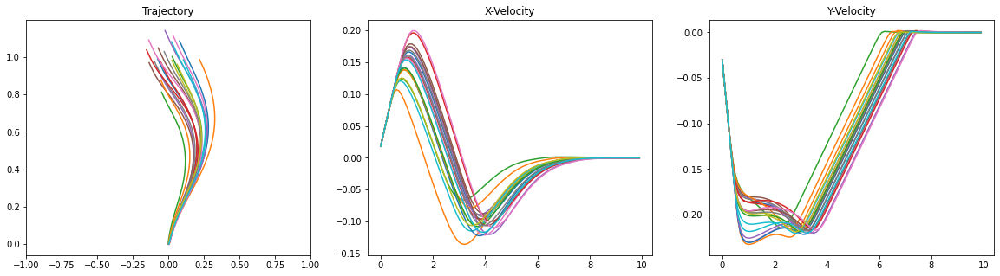

[51] loss: 0.000


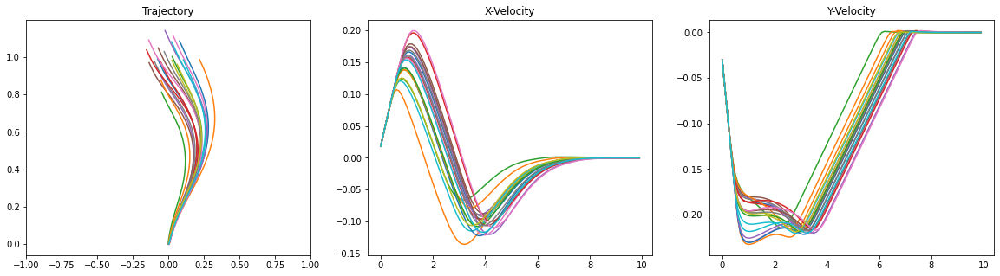

[52] loss: 0.000


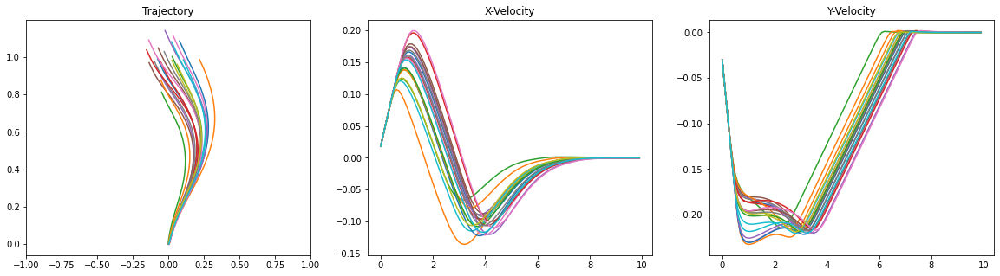

[53] loss: 0.000


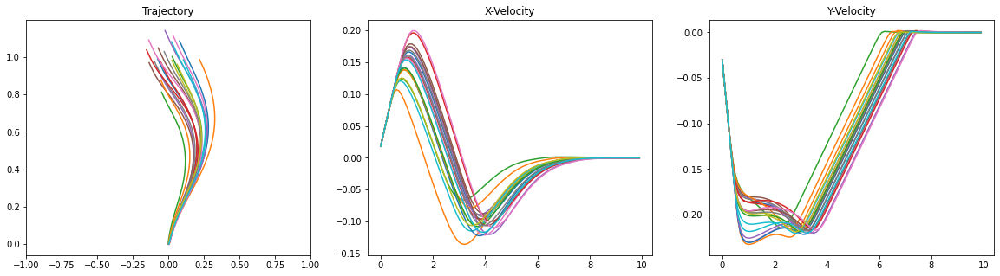

[54] loss: 0.000


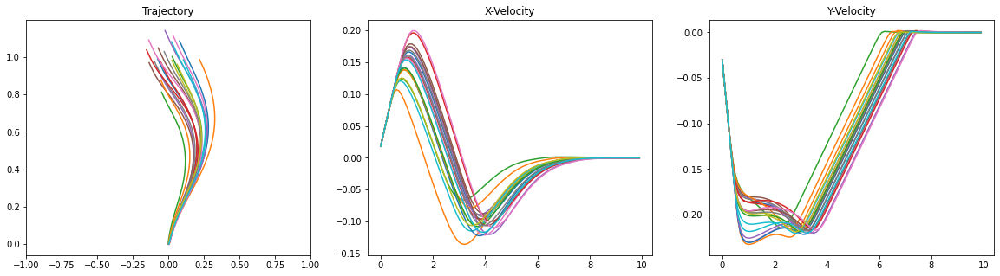

[55] loss: 0.000


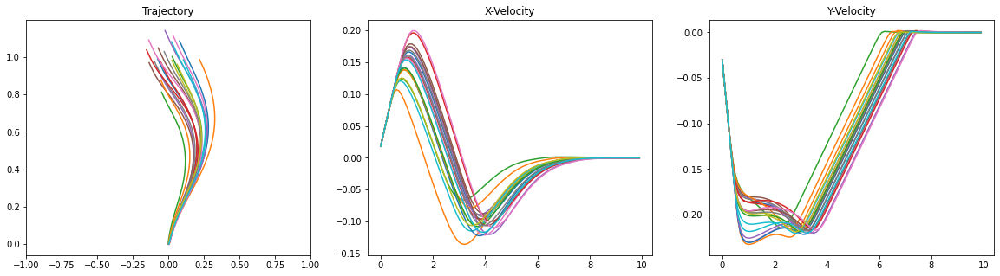

[56] loss: 0.000


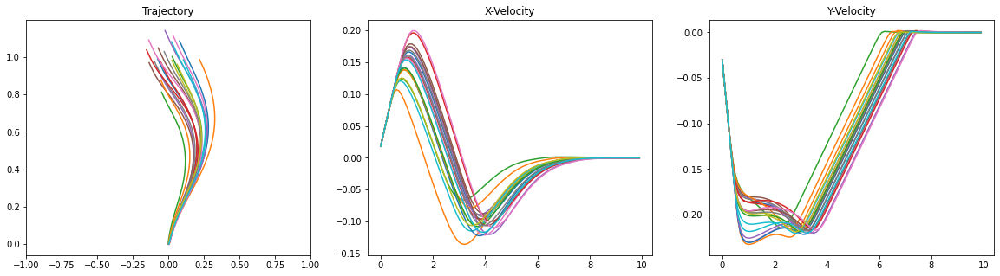

[57] loss: 0.000


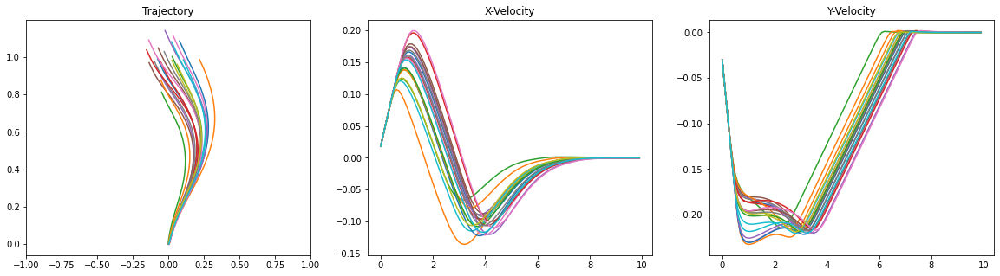

[58] loss: 0.000


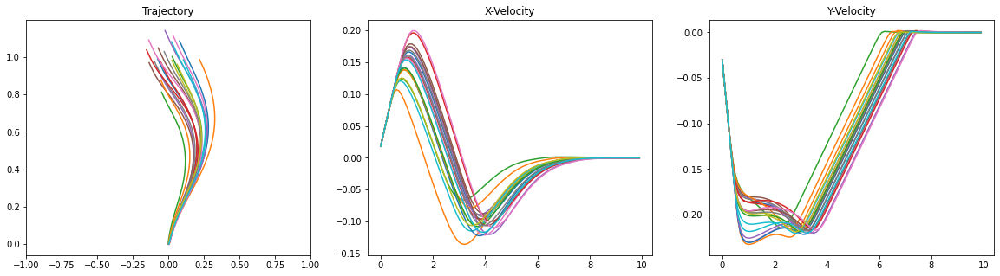

[59] loss: 0.000


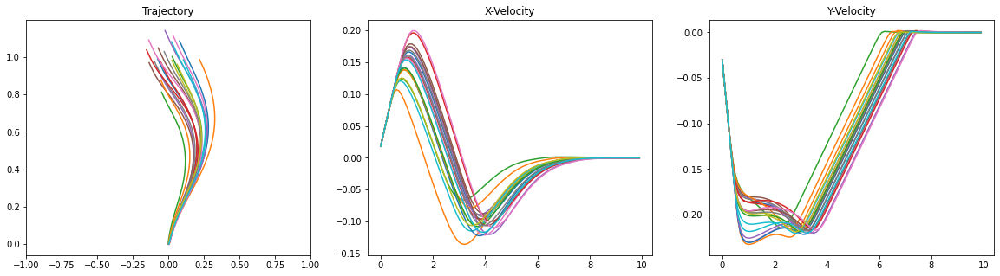

[60] loss: 0.000


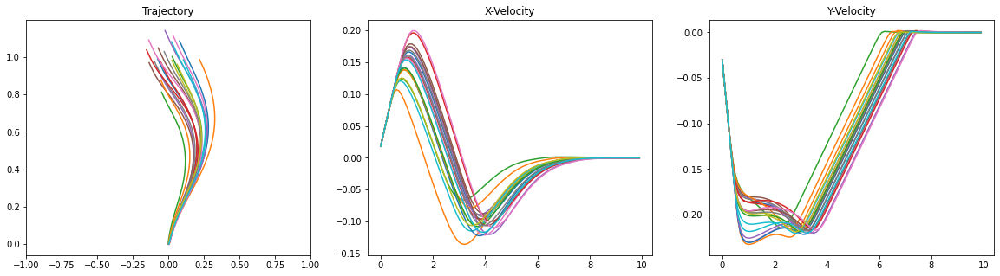

[61] loss: 0.000


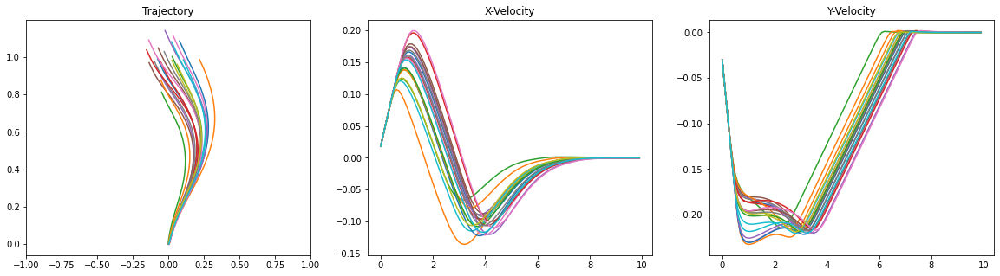

[62] loss: 0.000


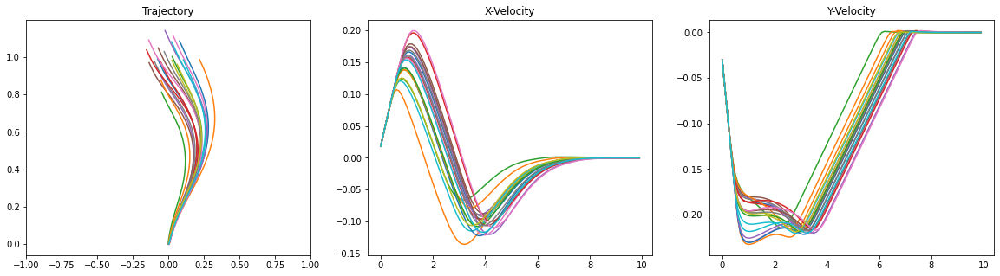

[63] loss: 0.000


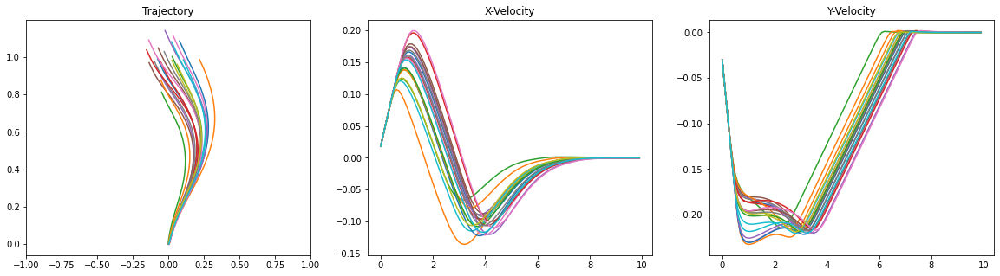

[64] loss: 0.000


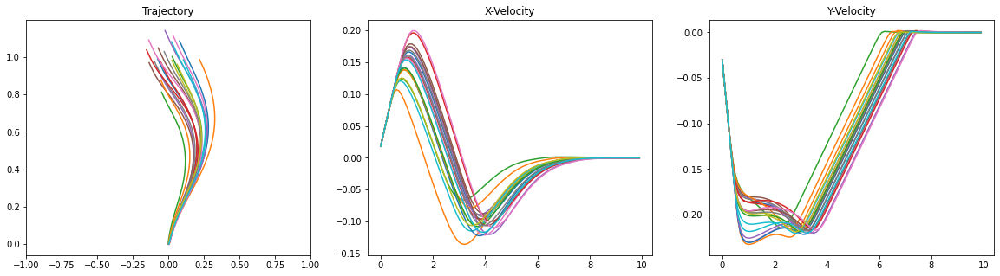

[65] loss: 0.000


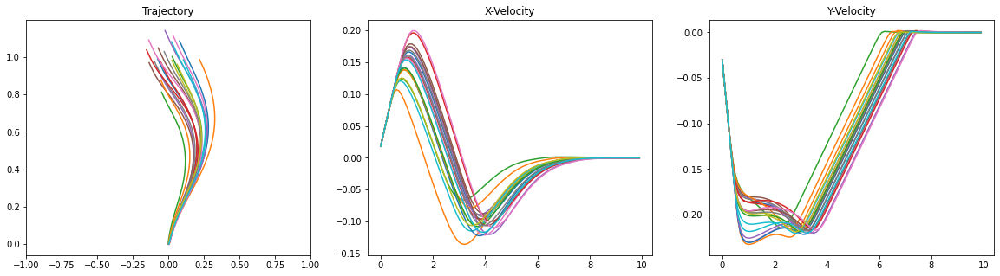

[66] loss: 0.000


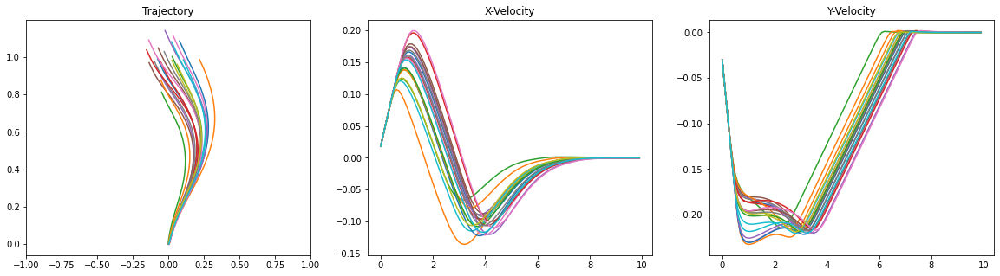

[67] loss: 0.000


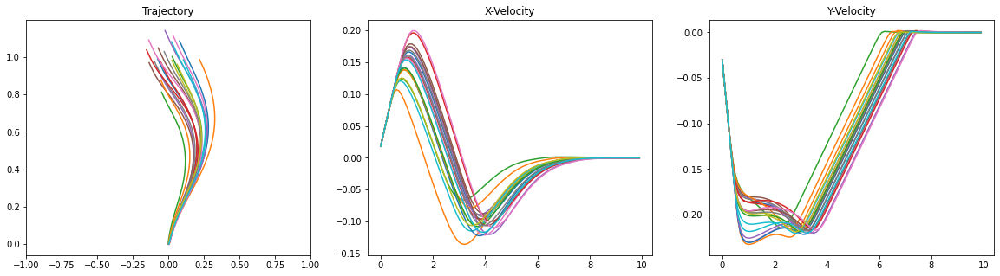

[68] loss: 0.000


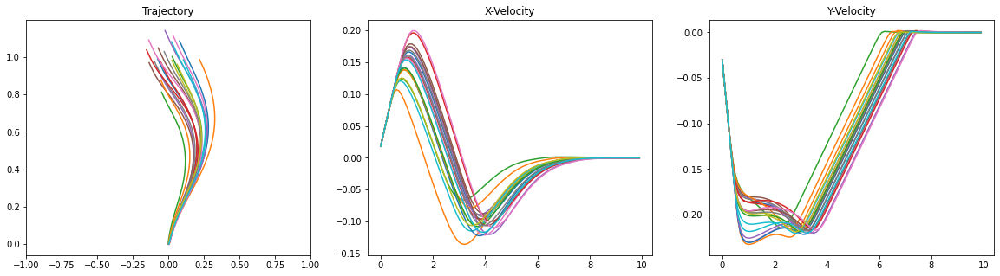

[69] loss: 0.000


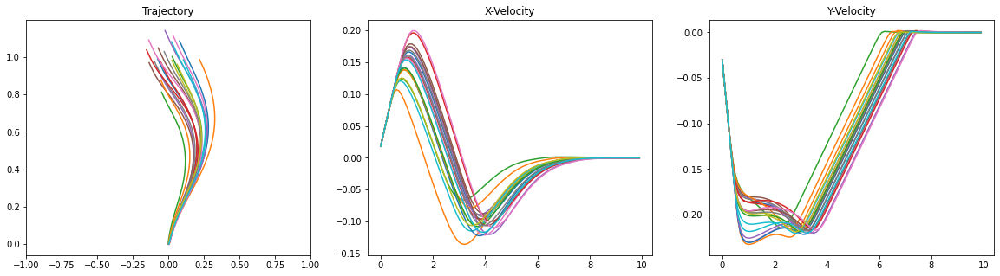

[70] loss: 0.000


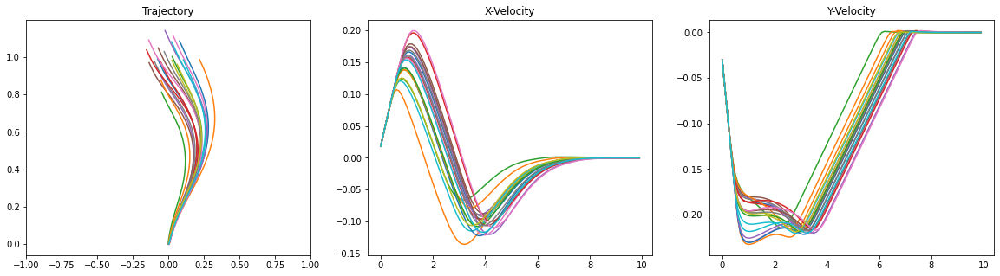

[71] loss: 0.000


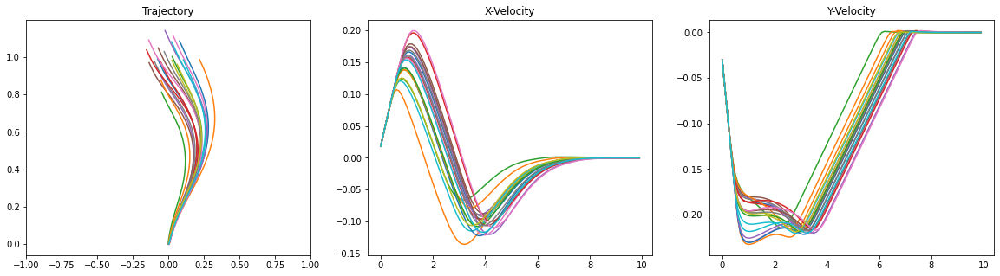

[72] loss: 0.000


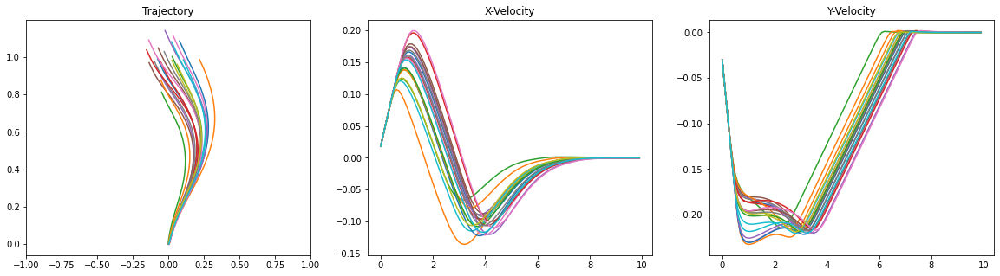

[73] loss: 0.000


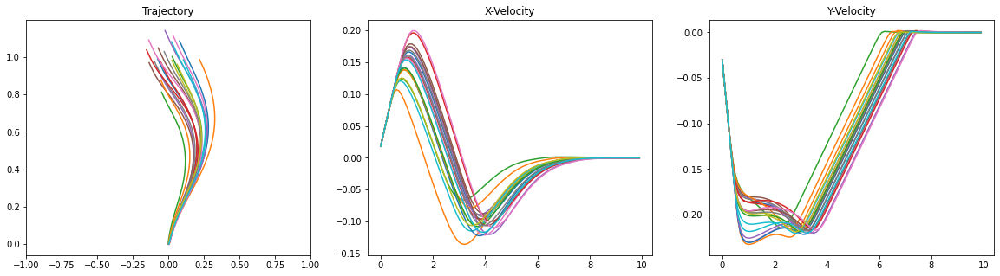

[74] loss: 0.000


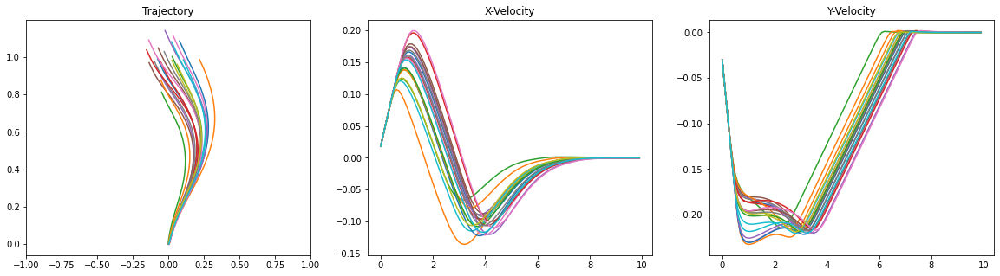

[75] loss: 0.000


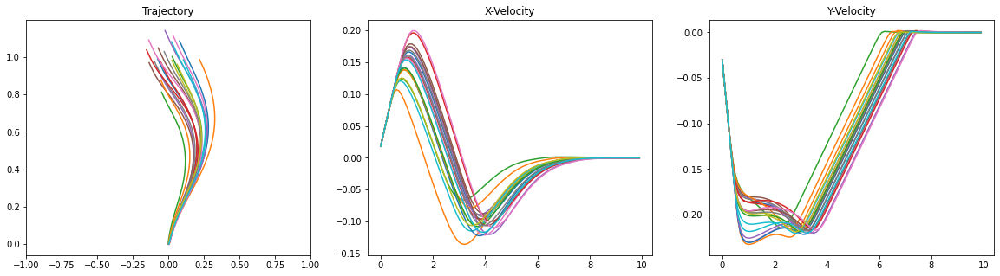

[76] loss: 0.000


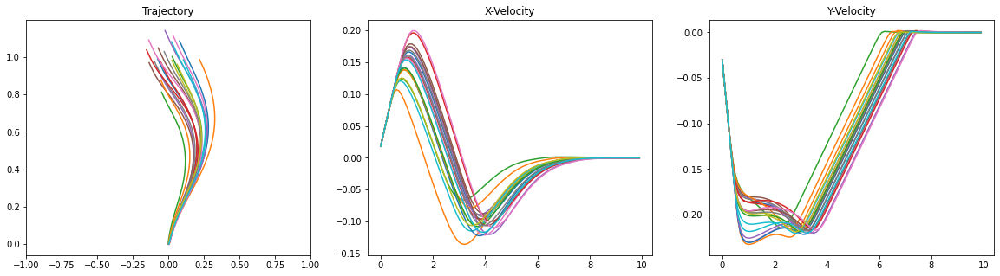

[77] loss: 0.000


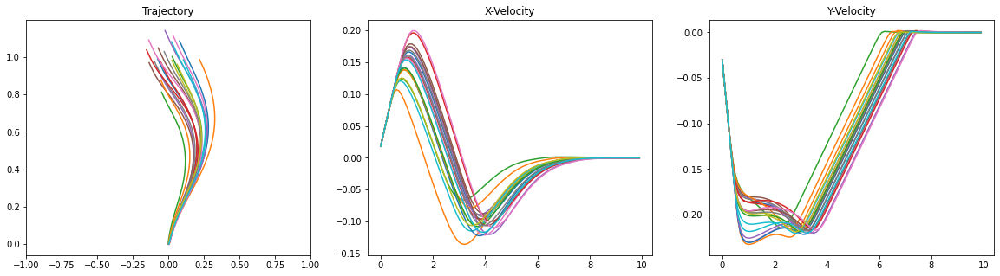

[78] loss: 0.000


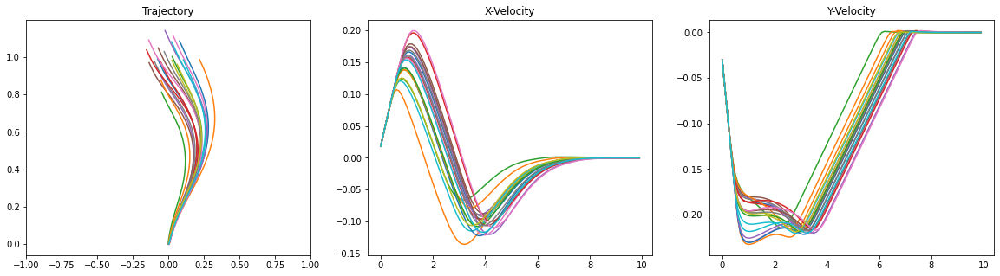

[79] loss: 0.000


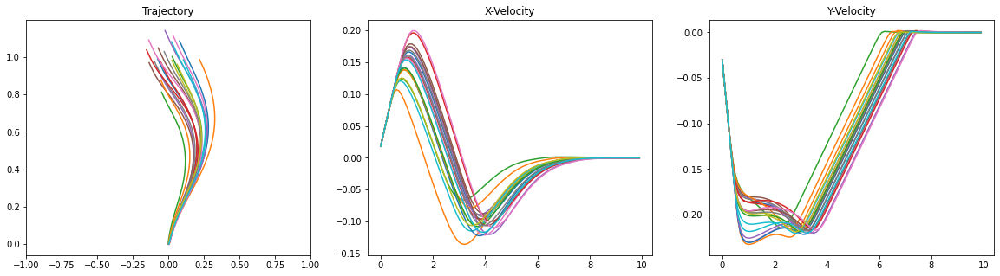

[80] loss: 0.000


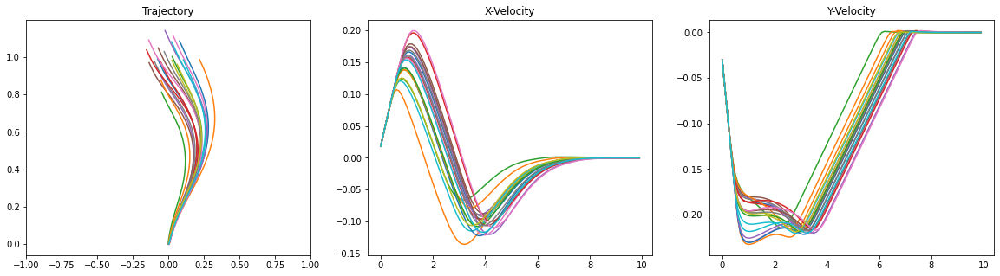

[81] loss: 0.000


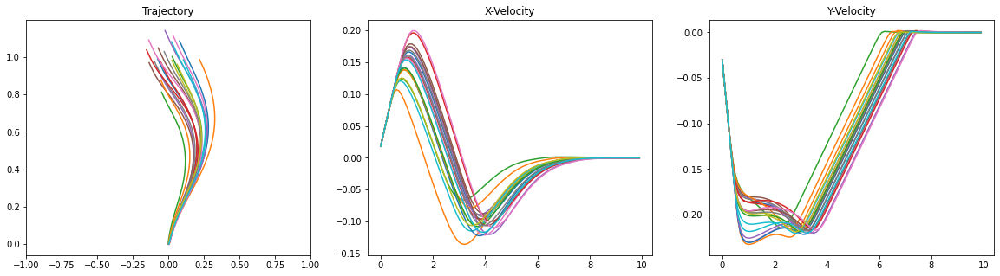

[82] loss: 0.000


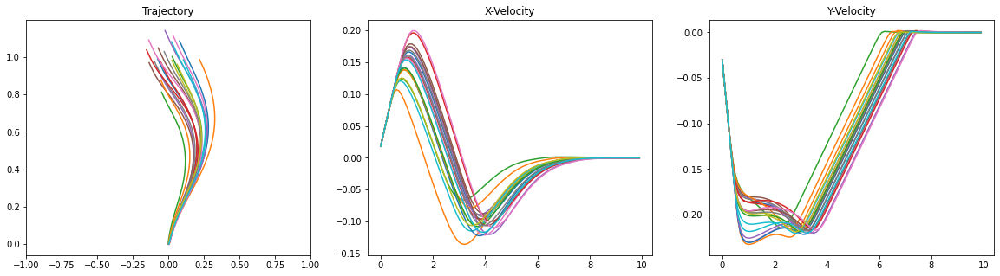

[83] loss: 0.000


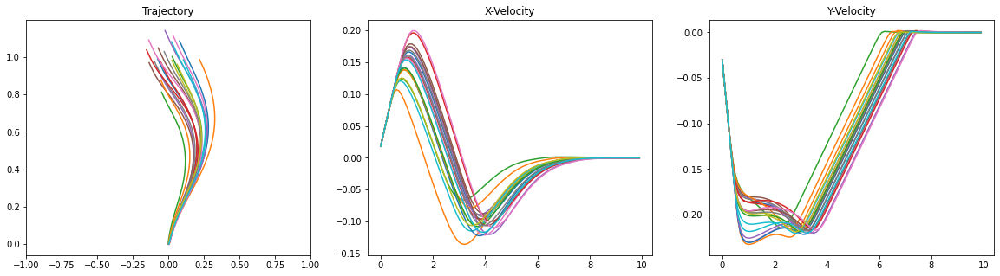

[84] loss: 0.000


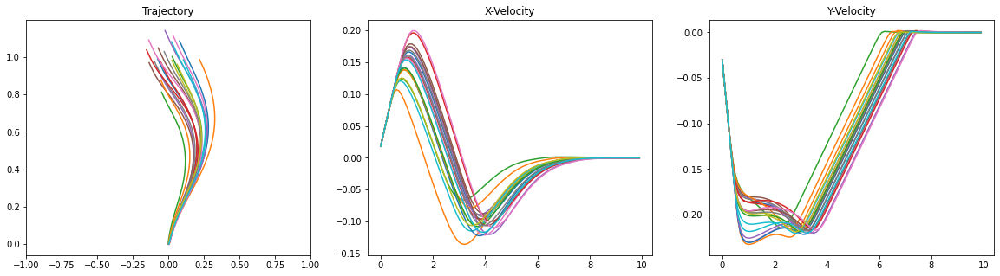

[85] loss: 0.000


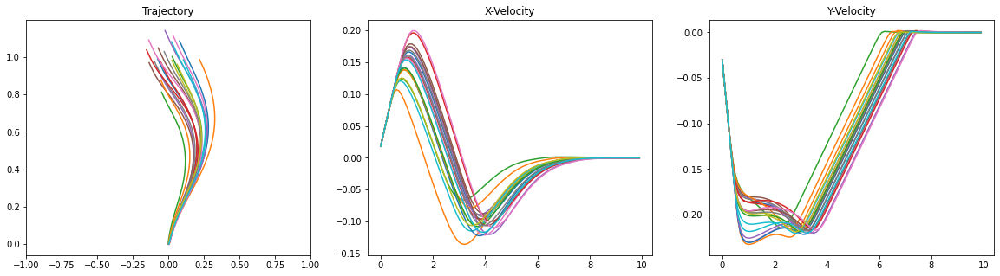

[86] loss: 0.000


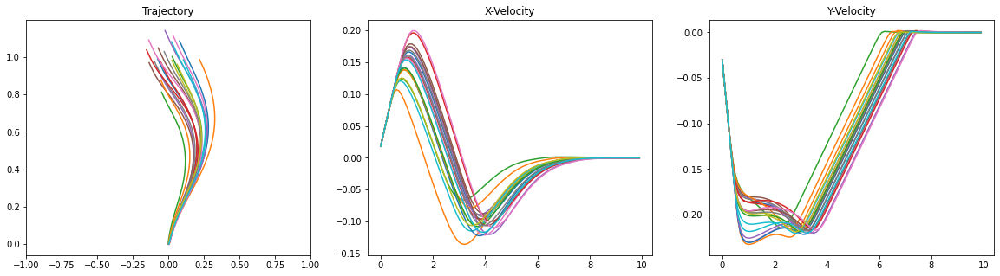

[87] loss: 0.000


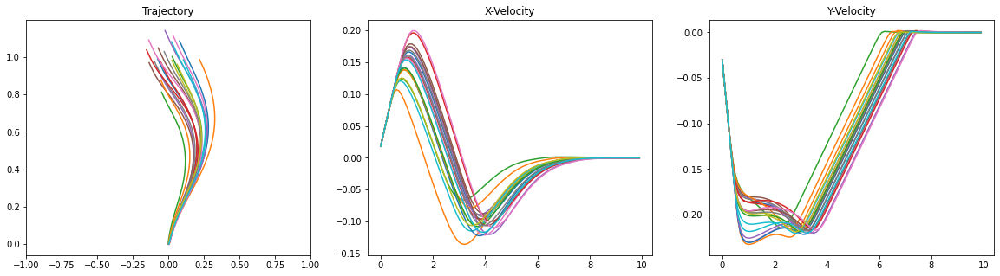

[88] loss: 0.000


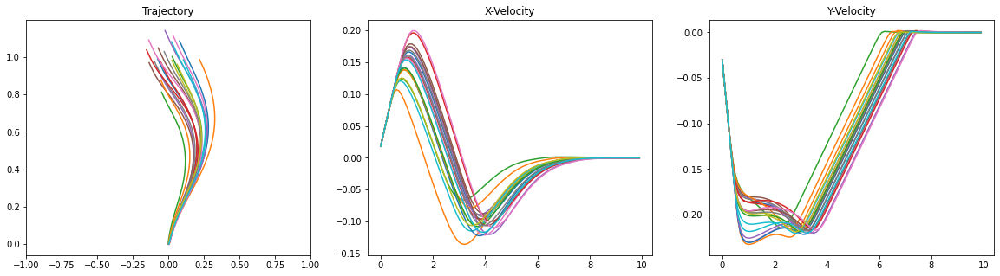

[89] loss: 0.000


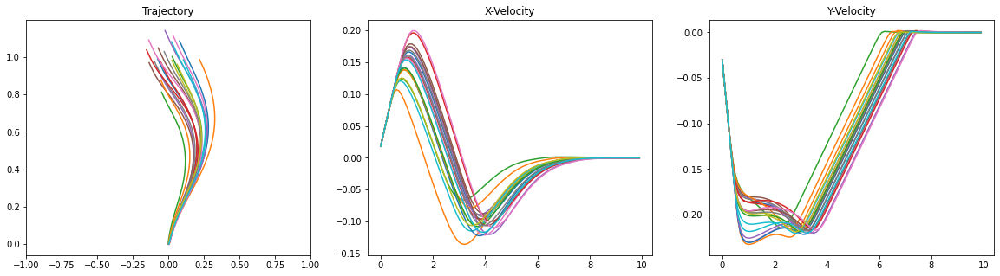

[90] loss: 0.000


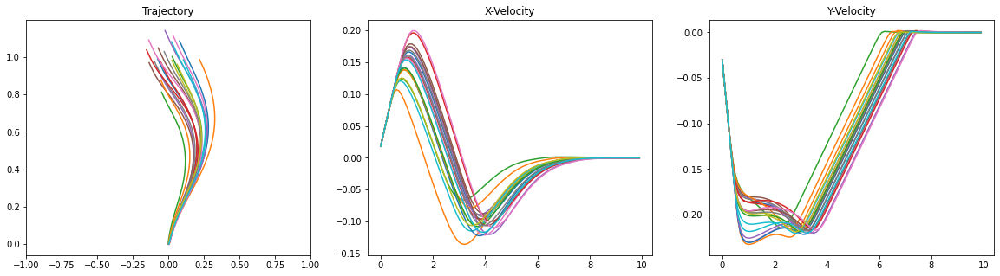

[91] loss: 0.000


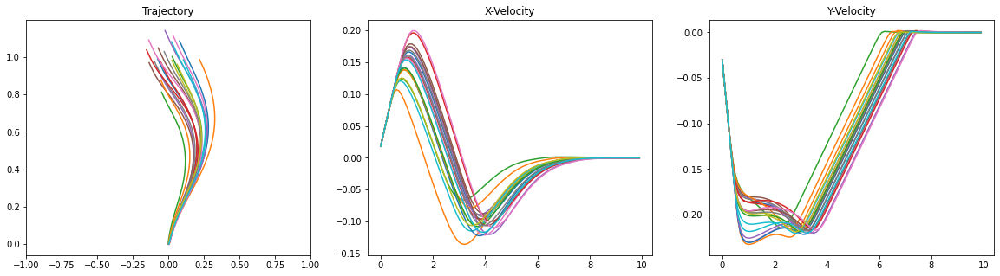

[92] loss: 0.000


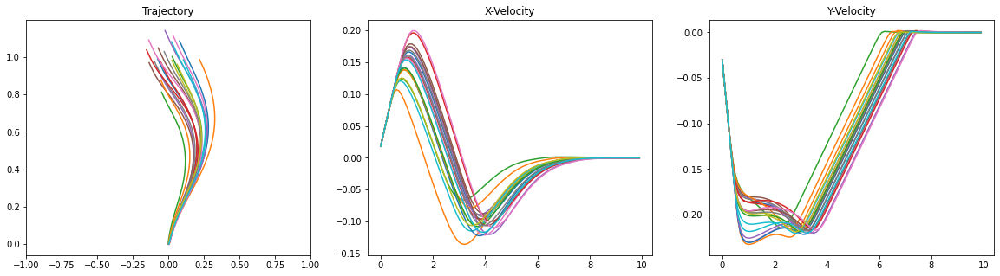

[93] loss: 0.000


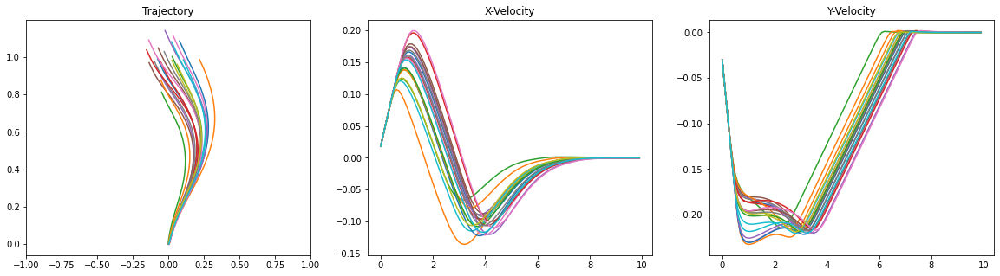

[94] loss: 0.000


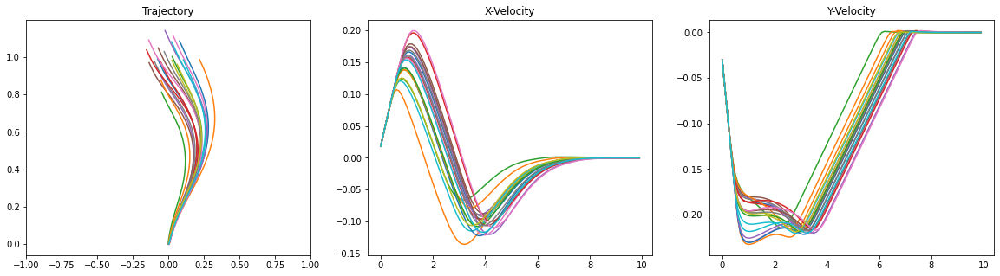

[95] loss: 0.000


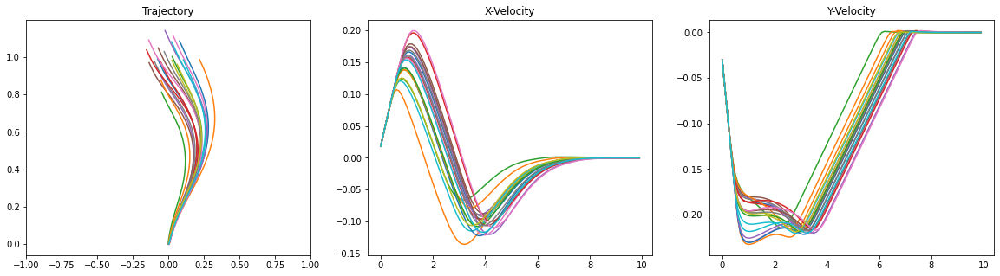

[96] loss: 0.000


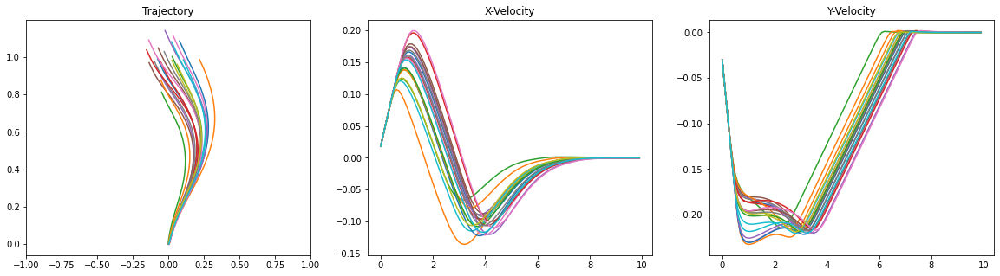

[97] loss: 0.000


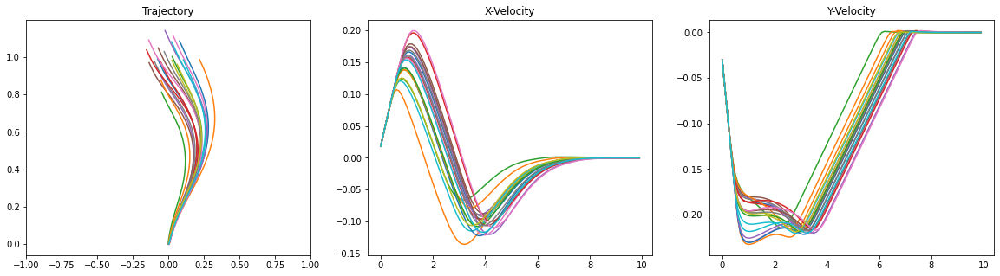

[98] loss: 0.000


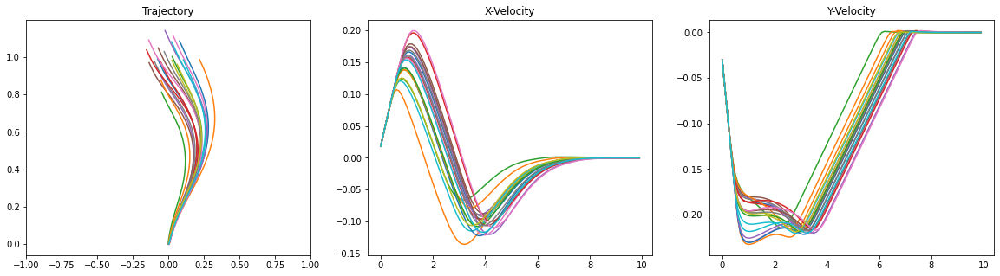

[99] loss: 0.000


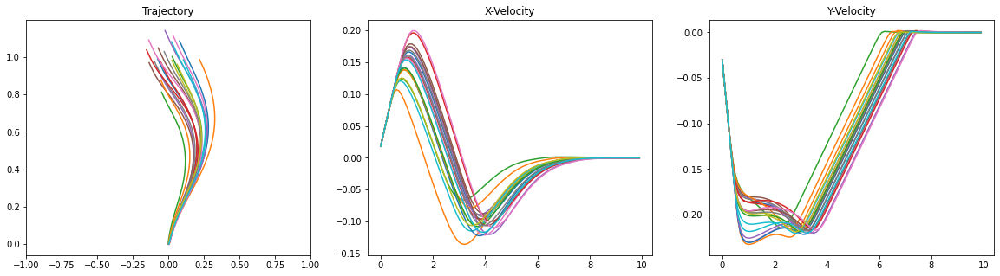

[100] loss: 0.000


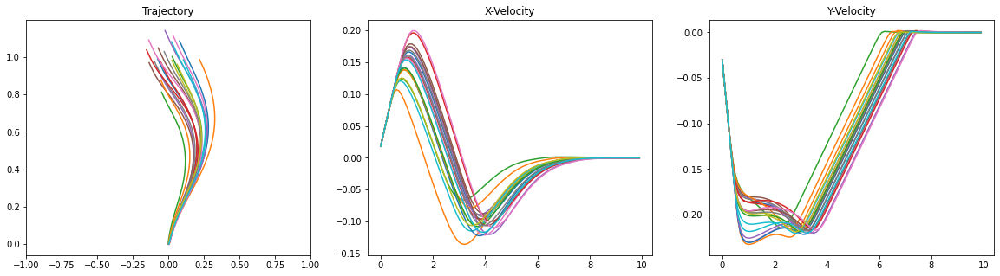

In [324]:
# Now it's time to run the code!
loss_ = [] # initialize
T = 100  # number of time steps
dim_input = 4  # state space dimensions
dim_hidden = 6  # latent dimensions
dim_output = 2  # action space dimensions
d = Dynamics()  # define dynamics
c = Controller(dim_input, dim_hidden, dim_output)  # define controller
s = Simulation(c, d, T)  # define simulation
o = Optimize(s)  # define optimizer
o.train(100)  # solve the optimization problem

### Analysis of Results
The convergence plot of loss is showing in the following figure and the corresponding optimal solution are showing in the figures
above. The optimal solution of the final time step indicates that the states are approaching to $\begin{bmatrix}0 & 0 & 0 & 0 \end{bmatrix}$ which is the theoretical final solution.
Therefore, the neural networks shows that it's ability to find the optimal solution of control system with given conditions.

Text(0.5, 1.0, 'Loss')

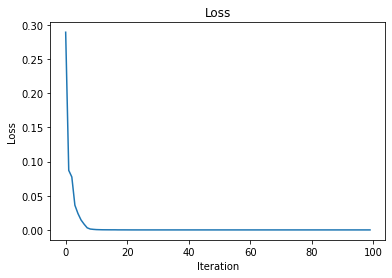

In [325]:
plt.plot(loss_)
plt.ylabel('Loss')
plt.xlabel('Iteration')
plt.title('Loss')
